In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0" 
# os.environ['http_proxy'] = 'http://10.16.35.10:13390' 
# os.environ['https_proxy'] = 'http://10.16.35.10:13390' 

import torch
from torch import nn
import torch.nn.functional as F

import sys
sys.path.append('..')
from prior_networks import UViT_Clip
from prior_pipe import PriorPipe
# from dataset import *
from utils import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# load prior diffusion

In [2]:
diffusion_prior = UViT_Clip(embed_dim=512, num_heads=8, mlp_ratio=4)
# number of parameters
sum(p.numel() for p in diffusion_prior.parameters() if p.requires_grad)
pipe = PriorPipe(diffusion_prior, device=device)
# load pretrained model
model_name = 'uvit_vice_pred_imagenet' 
path = f'../ckpts/{model_name}'
pipe.diffusion_prior.load_state_dict(torch.load(f'{path}.pt'))
# pipe.ema.load_state_dict(torch.load(f'{path}_ema.pt'))

<All keys matched successfully>

# load sd

In [3]:
# extract image features
from diffusers.utils import load_image
from IPython.display import Image, display
from customized_pipe import Generator4Embeds, encode_image
from transformers import CLIPVisionModelWithProjection, CLIPImageProcessor
import torch

feature_extractor = CLIPImageProcessor()
image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "h94/IP-Adapter", 
    subfolder="models/image_encoder",
    torch_dtype=torch.float16,
).to("cuda")

pipe_image = Generator4Embeds(path='stabilityai/sdxl-turbo', num_inference_steps=4)
# pipe_image = Generator4Embeds(path='stabilityai/stable-diffusion-xl-base-1.0', num_inference_steps=25)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
pipe_image.pipe.feature_extractor = feature_extractor
pipe_image.pipe.image_encoder = image_encoder

In [5]:
from diffusers.schedulers import DDPMScheduler
scheduler = DDPMScheduler(
    thresholding=False,
    clip_sample=False,
)
pipe.scheduler = scheduler
print((
    pipe.scheduler.config.thresholding, 
    pipe.scheduler.config.sample_max_value, 
    pipe.scheduler.config.clip_sample,
    pipe.scheduler.config.clip_sample_range
))

(False, 1.0, False, 1.0)


# load concept encoder

In [9]:
# Load concept encoder
from networks import SimpleRegProb
# concept_encoder = MLPProb(1024, 42, l1=0.01).to(device)
concept_encoder = SimpleRegProb(1024, 42, l1=0).to(device)
path_save = os.path.join('../ckpts', 'emb_predict_SimpleReg.pt')
concept_encoder.load_state_dict(torch.load(path_save)['parameters'])

<All keys matched successfully>

In [10]:
from diffusers.utils import load_image, make_image_grid

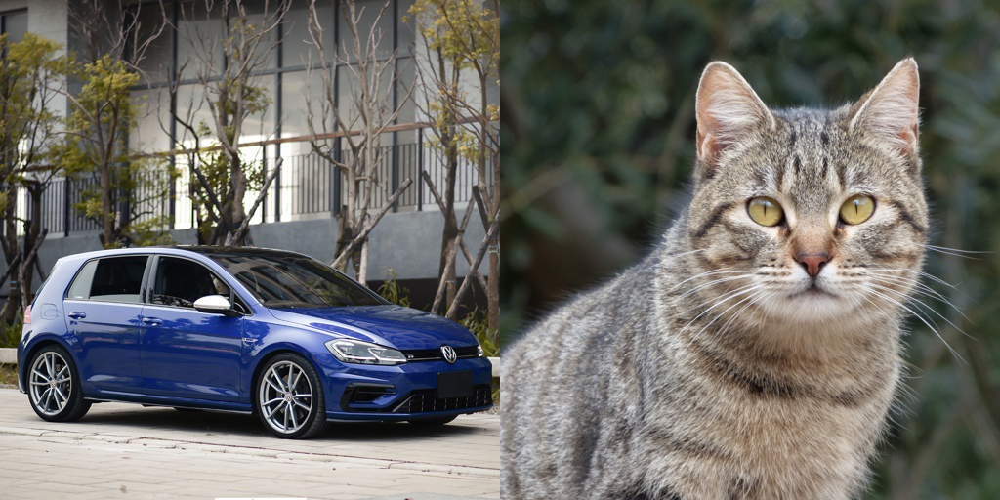

In [18]:
# extract a concept embedding
image_prompt = load_image("../images/car.jpg")
image_prompt2 = load_image("../images/cat.jpg")
# image_prompt = load_image("https://image-cdn.hypb.st/https%3A%2F%2Fhypebeast.com%2Fwp-content%2Fblogs.dir%2F6%2Ffiles%2F2022%2F10%2Fstudio-ghibli-hayao-miyazaki-new-movie-almost-finished-1.jpg?cbr=1&q=90")
from IPython.display import display 
with torch.no_grad():
    refs_clip = encode_image([image_prompt, image_prompt2], image_encoder, feature_extractor)
    refs_concepts = concept_encoder(refs_clip.float())   
display(make_image_grid([image_prompt, image_prompt2], rows=1, cols=2, resize=512))

# Experiments

In [12]:
property_features = torch.load(os.path.join('../ckpts', 'property_features.pt'))
word_emb = property_features['text_features']
word_list = property_features['text']
label_concept = torch.load(os.path.join('../ckpts', 'label_dim.pt'))

## given 2 refs, generate triplet 

In [19]:
num = 8

seed_value = 1
generators = [torch.Generator(device=device).manual_seed(1) for _ in range(num)]
seed_values = torch.randint(10000, (num, ), generator=torch.Generator(device=device).manual_seed(seed_value), device=device)
print('Seed values:', seed_values)
for seed, generator in zip(seed_values, generators):
    generator.manual_seed(seed.item())

from guidance_set import get_loss_triplet_entropy, fns_collector
# Adjust loss functions to handle batched input
loss_triplet_entropy = get_loss_triplet_entropy(
    concept_encoder,
    refs_clip.float()
)

loss_func = fns_collector(
    fns=[
        loss_triplet_entropy,
    ],
    scales=[1.]
)


# Generate all embeddings in one pass
h = pipe.generate_guidance(
    loss_fn=loss_func,
    num_inference_steps=50,
    num_resampling_steps=5,
    guidance_scale=0.1,
    generator=generators,
    use_ema=False,
    latent=None,
    strength=1,
    N=num,
    shape=(1024,)
)

# Generate all images in parallel
pipe_image.pipe.set_ip_adapter_scale(1)

images = pipe_image.generate(
    h.to(dtype=torch.float16),
    generator=generators,
)

Seed values: tensor([4032, 6450, 5999,  127, 2256, 6366, 2011, 5281], device='cuda:0')


0it [00:00, ?it/s]

50it [00:06,  8.26it/s]
/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/diffusers/configuration_utils.py:139: FutureWarning: Accessing config attribute `_name_or_path` directly via 'StableDiffusionXLPipeline' object attribute is deprecated. Please access '_name_or_path' over 'StableDiffusionXLPipeline's config object instead, e.g. 'scheduler.config._name_or_path'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4 [00:00<?, ?it/s]

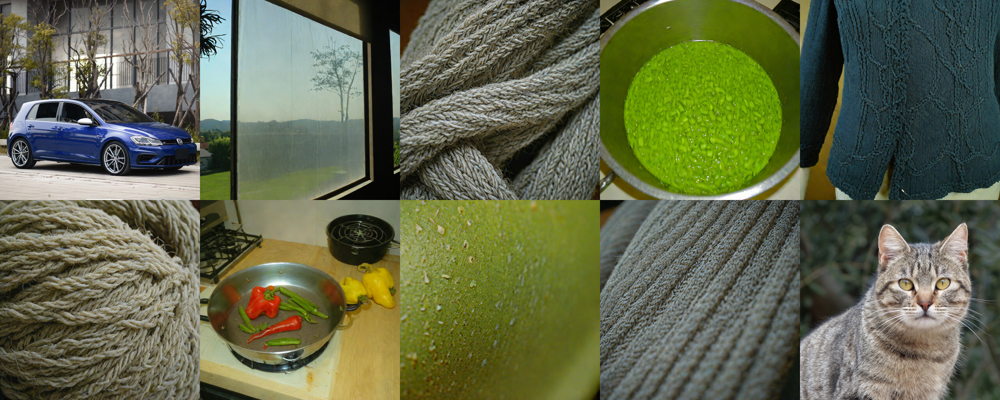

In [20]:
display(make_image_grid([image_prompt, *images, image_prompt2], rows=2, cols=5, resize=512))

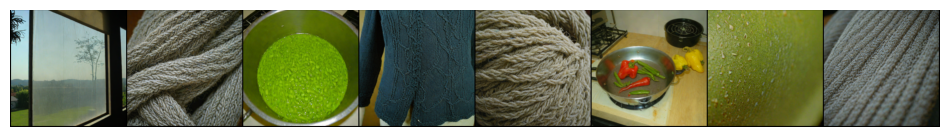

In [21]:
plot_indices_grid(images, shape=(1,8))

In [22]:
with torch.no_grad():
    images_embeds = encode_image(images, image_encoder, feature_extractor)
    images_concepts = concept_encoder(images_embeds.float())
    # create c (B, 3, D)
    c = torch.cat([images_concepts.unsqueeze(1), refs_concepts.unsqueeze(0).repeat(images_concepts.size(0), 1, 1)], dim=1)
    similarity = torch.einsum('bnd,bmd->bnm', c, c) # (B, 3, 3)
    similarity = torch.triu(similarity, diagonal=1) # (B, 3, 3)
    similarity_123 = similarity[similarity.triu(diagonal=1) != 0].view(-1, 3) # (B, 3)
    prob_triplet = similarity_123.softmax(dim=-1) # (B, 3)

In [23]:
prob = prob_triplet.mean(dim=0)*8

In [24]:
prob

tensor([2.4736, 2.8198, 2.7065], device='cuda:0')

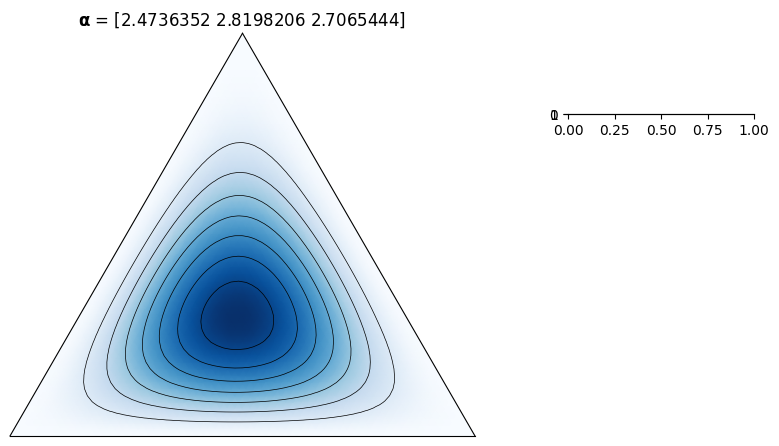

In [26]:
import matplotlib.pyplot as plt
from mpltern.datasets import get_dirichlet_pdfs

# Create the canvas
fig = plt.figure(figsize=(6, 6))

# Set the alpha parameter, converting from a PyTorch tensor to a tuple
alpha = prob.cpu().detach().numpy()  # Assuming these values have been transferred from the device to standard Python float on CPU

# Add a subplot for the ternary plot
ax = fig.add_subplot(1, 1, 1, projection="ternary")

# Get Dirichlet distribution data
t, l, r, v = get_dirichlet_pdfs(n=61, alpha=alpha)

cmap = "Blues"
shading = "gouraud"
# Plot the filled ternary plot and contours
cs = ax.tripcolor(t, l, r, v, cmap=cmap, shading=shading, rasterized=True)
ax.tricontour(t, l, r, v, colors="k", linewidths=0.5)

# Set axis labels
# ax.set_tlabel("$P(y=a)$")
# ax.set_llabel("$P(y=b)$")
# ax.set_rlabel("$P(y=c)$")

# Adjust label positions
ax.taxis.set_label_position("tick1")
ax.laxis.set_label_position("tick1")
ax.raxis.set_label_position("tick1")

ax.taxis.set_ticks([])
ax.laxis.set_ticks([])
ax.raxis.set_ticks([])

# Set subplot title
ax.set_title("${\\mathbf{\\alpha}}$ = " + str(alpha))

# Add color bar
cax = ax.inset_axes([1.2, 0.8, 0.4, 0.0], transform=ax.transAxes)
# colorbar = fig.colorbar(cs, cax=cax)
# colorbar.set_label("PDF", rotation=270, va="baseline")

# Show the plot
plt.show()

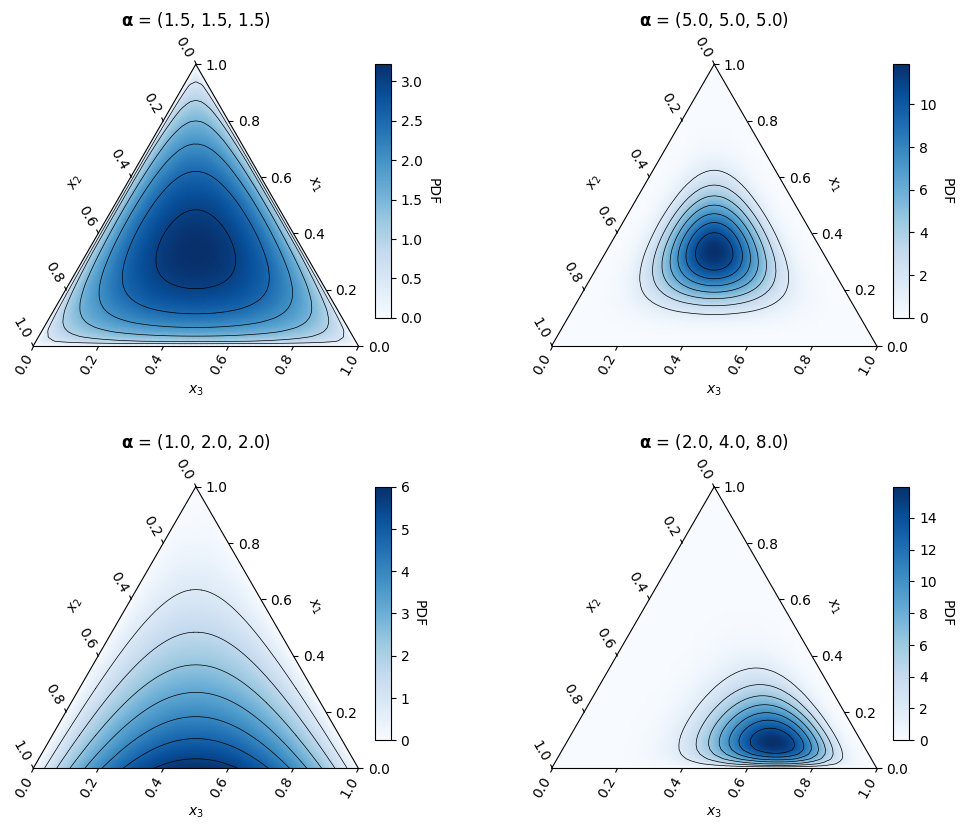

In [27]:
import matplotlib.pyplot as plt
from mpltern.datasets import get_dirichlet_pdfs

fig = plt.figure(figsize=(10.8, 8.8))
fig.subplots_adjust(
    left=0.1,
    right=0.9,
    bottom=0.1,
    top=0.9,
    wspace=0.5,
    hspace=0.5,
)

alphas = ((1.5, 1.5, 1.5), (5.0, 5.0, 5.0), (1.0, 2.0, 2.0), (2.0, 4.0, 8.0))
for i, alpha in enumerate(alphas):
    ax = fig.add_subplot(2, 2, i + 1, projection="ternary")
    t, l, r, v = get_dirichlet_pdfs(n=61, alpha=alpha)
    cmap = "Blues"
    shading = "gouraud"
    cs = ax.tripcolor(t, l, r, v, cmap=cmap, shading=shading, rasterized=True)
    ax.tricontour(t, l, r, v, colors="k", linewidths=0.5)

    ax.set_tlabel("$x_1$")
    ax.set_llabel("$x_2$")
    ax.set_rlabel("$x_3$")

    ax.taxis.set_label_position("tick1")
    ax.laxis.set_label_position("tick1")
    ax.raxis.set_label_position("tick1")

    ax.set_title("${\\mathbf{\\alpha}}$ = " + str(alpha))

    cax = ax.inset_axes([1.05, 0.1, 0.05, 0.9], transform=ax.transAxes)
    colorbar = fig.colorbar(cs, cax=cax)
    colorbar.set_label("PDF", rotation=270, va="baseline")

plt.show()

In [28]:
def ternary_plot(prob_triplet):

    # Example data: N triplets of probabilities (N, 3)
    prob_triplet = prob_triplet.detach().cpu().numpy()

    # Initialize the ternary plot
    figure, tax = ternary.figure(scale=1.0)
    tax.set_title("Ternary Plot", fontsize=20)

    # Plot the data points
    tax.scatter(prob_triplet, marker='o', color='blue', label='Data Points')

    # # Set axis labels
    # tax.left_axis_label("Component 1", fontsize=15)
    # tax.right_axis_label("Component 2", fontsize=15)
    # tax.bottom_axis_label("Component 3", fontsize=15)

    # Draw boundary and gridlines
    tax.boundary(linewidth=2.0)
    tax.gridlines(multiple=0.1, color="grey")

    # # Set ticks
    # ticks = [round(i * 0.1, 1) for i in range(11)]
    # tax.ticks(ticks=ticks, axis='lbr', linewidth=1, multiple=0.1)

    # Remove default matplotlib axes
    tax.clear_matplotlib_ticks()

    # Show legend
    tax.legend()

    # Show the plot
    plt.show()

/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


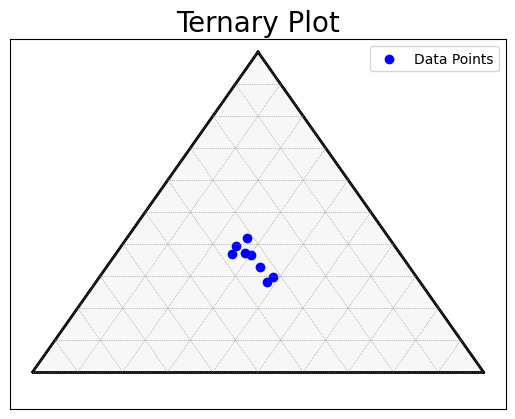

In [29]:
ternary_plot(prob_triplet)

### uninformative triplet

In [65]:
num = 6

seed_value = 0
generators = [torch.Generator(device=device).manual_seed(1) for _ in range(num)]
seed_values = torch.randint(10000, (num, ), generator=torch.Generator(device=device).manual_seed(seed_value), device=device)
print('Seed values:', seed_values)
for seed, generator in zip(seed_values, generators):
    generator.manual_seed(seed.item())

# Adjust loss functions to handle batched input
loss_triplet_entropy = get_loss_triplet_entropy(
    concept_encoder,
    refs_clip.float()
)

loss_func = fns_collector(
    fns=[
        loss_triplet_entropy,
    ],
    scales=[-1.]
)


# Generate all embeddings in one pass
h = pipe.generate_guidance(
    loss_fn=loss_func,
    num_inference_steps=50,
    num_resampling_steps=5,
    guidance_scale=.1,
    generator=generators,
    use_ema=False,
    latent=None,
    strength=1,
    N=num,
    shape=(1024,)
)

# Generate all images in parallel
pipe_image.pipe.set_ip_adapter_scale(1)

images = pipe_image.generate(
    h.to(dtype=torch.float16),
    generator=generators,
)


Seed values: tensor([1541,   97, 5191,  172, 2553, 4604], device='cuda:0')


50it [00:05,  9.73it/s]
/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/diffusers/configuration_utils.py:139: FutureWarning: Accessing config attribute `_name_or_path` directly via 'StableDiffusionXLPipeline' object attribute is deprecated. Please access '_name_or_path' over 'StableDiffusionXLPipeline's config object instead, e.g. 'scheduler.config._name_or_path'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4 [00:00<?, ?it/s]

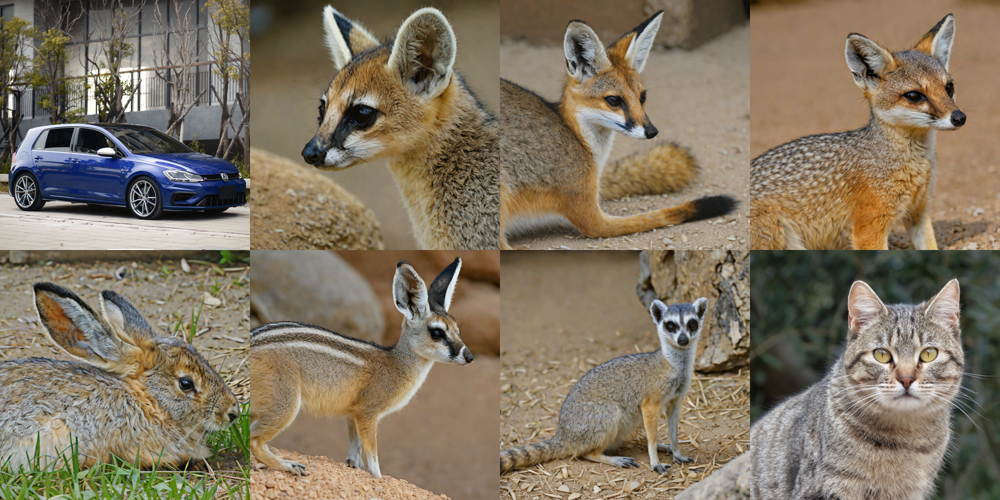

In [66]:
display(make_image_grid([image_prompt, *images, image_prompt2], rows=2, cols=4, resize=512))


In [67]:
with torch.no_grad():
    images_embeds = encode_image(images, image_encoder, feature_extractor)
    images_concepts = concept_encoder(images_embeds.float())
    # create c (B, 3, D)
    c = torch.cat([images_concepts.unsqueeze(1), refs_concepts.unsqueeze(0).repeat(images_concepts.size(0), 1, 1)], dim=1)
    similarity = torch.einsum('bnd,bmd->bnm', c, c) # (B, 3, 3)
    similarity = torch.triu(similarity, diagonal=1) # (B, 3, 3)
    similarity_123 = similarity[similarity.triu(diagonal=1) != 0].view(-1, 3) # (B, 3)
    prob_triplet = similarity_123.softmax(dim=-1) # (B, 3)

/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


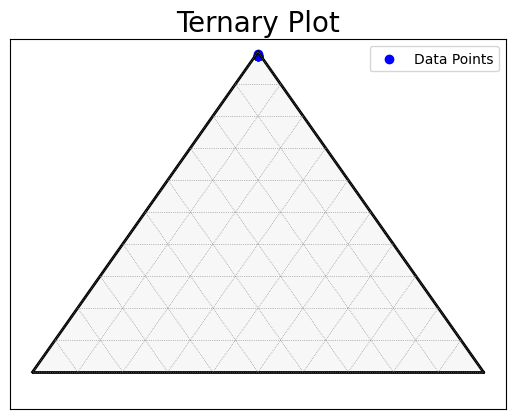

In [68]:
ternary_plot(prob_triplet)

## [archive] given 0 ref, generate triplet trials.

0 ref do not make sense, as they tend to be same or be distant

In [16]:
a = torch.randn(2,3,3)
# extract uptri elements (a(3,3) -> (3,))
a, a[a.triu(diagonal=1) != 0].view(2,3)

(tensor([[[-0.5592,  0.1515,  1.1017],
          [ 0.6831,  1.2222,  0.4752],
          [-0.1820, -1.7360, -0.2266]],
 
         [[-0.7868,  1.2142,  1.2011],
          [ 0.7032, -0.8773, -0.2730],
          [-0.5637,  1.3842, -1.0602]]]),
 tensor([[ 0.1515,  1.1017,  0.4752],
         [ 1.2142,  1.2011, -0.2730]]))

In [17]:
a.triu(diagonal=1)

tensor([[[ 0.0000,  0.1515,  1.1017],
         [ 0.0000,  0.0000,  0.4752],
         [ 0.0000,  0.0000,  0.0000]],

        [[ 0.0000,  1.2142,  1.2011],
         [ 0.0000,  0.0000, -0.2730],
         [ 0.0000,  0.0000,  0.0000]]])

In [18]:




def get_loss_triplet_entropy_0ref(concept_enc):
    def loss_triplet_entropy_0ref(x):
        # x: (B*3, D)
        c_pre = concept_enc(x)  # (B*3, D)
        c_pre = c_pre.view(-1, 3, c_pre.size(1)) # (B, 3, D)
        similarity = torch.einsum('bnd,bmd->bnm', c_pre, c_pre) # (B, 3, 3)
        similarity = torch.triu(similarity, diagonal=1) # (B, 3, 3)
        similarity_123 = similarity[similarity.triu(diagonal=1) != 0].view(-1, 3) # (B, 3)
        prob_triplet = similarity_123.softmax(dim=-1) # (B, 3)
        # entropy of triplet 
        eps = 1e-6
        entropy = - (prob_triplet * (prob_triplet+eps).log()).sum(dim=-1)
        loss = - entropy
        return loss.mean()
    return loss_triplet_entropy_0ref

def get_loss_triplet_distance(threshold=0.95):
    def loss_triplet_distance(x):
        N = x.size(0)
        assert n_diag < N, f"n_diag must be less than the batch size N={N}"

        # Compute similarity matrix
        sim = F.cosine_similarity(x.unsqueeze(1), x.unsqueeze(0), dim=-1)

        # Initialize target similarity matrix with NaNs to ignore in loss calculation
        target_sim = torch.full((N, N), 0.0, device=x.device)

        # Set target similarities on the upper triangular of the first n off-diagonals to 1
        for i in range(1, n_diag + 1):
            target_sim += torch.diag(torch.full((N - i,), 1., device=x.device), i)
            # target_sim += torch.diag(torch.full((N - i,), 1.0, device=x.device), -i) 

        # Mask out NaN values in target_sim for loss calculation
        valid_mask = target_sim != 0
        valid_mask[sim>=threshold] = False
        # in case of no valid mask
        if valid_mask.sum() == 0:
            return torch.tensor(0.0, device=x.device, requires_grad=True)
        loss = F.mse_loss(sim[valid_mask], target_sim[valid_mask])
        # loss = F.mse_loss(sim.view(-1), target_sim.view(-1))
        return loss.mean()
    return loss_triplet_0ref

In [19]:
num = 9

seed_value = 0
generators = [torch.Generator(device=device).manual_seed(1) for _ in range(num)]
for generator in generators:
    generator.manual_seed(seed_value)

# Adjust loss functions to handle batched input
loss_smooth = get_loss_smooth(n_diag=3, threshold=1)
loss_triplet_entropy_0ref = get_loss_triplet_entropy_0ref(concept_encoder)

loss_func = fns_collector(
    fns=[
        loss_triplet_entropy_0ref,
    ],
    scales=[1.]
)


# Generate all embeddings in one pass
h = pipe.generate_guidance(
    loss_fn=loss_func,
    num_inference_steps=50,
    num_resampling_steps=5,
    guidance_scale=0.1,
    generator=generators,
    use_ema=False,
    latent=None,
    strength=1,
    N=num,
    shape=(1024,)
)

# Generate all images in parallel
pipe_image.pipe.set_ip_adapter_scale(1)

images = pipe_image.generate(
    h.to(dtype=torch.float16),
    generator=generators,
)


0it [00:00, ?it/s]

50it [00:06,  7.79it/s]
/home/weichen/miniconda3/envs/sd/lib/python3.11/site-packages/diffusers/configuration_utils.py:139: FutureWarning: Accessing config attribute `_name_or_path` directly via 'StableDiffusionXLPipeline' object attribute is deprecated. Please access '_name_or_path' over 'StableDiffusionXLPipeline's config object instead, e.g. 'scheduler.config._name_or_path'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/4 [00:00<?, ?it/s]

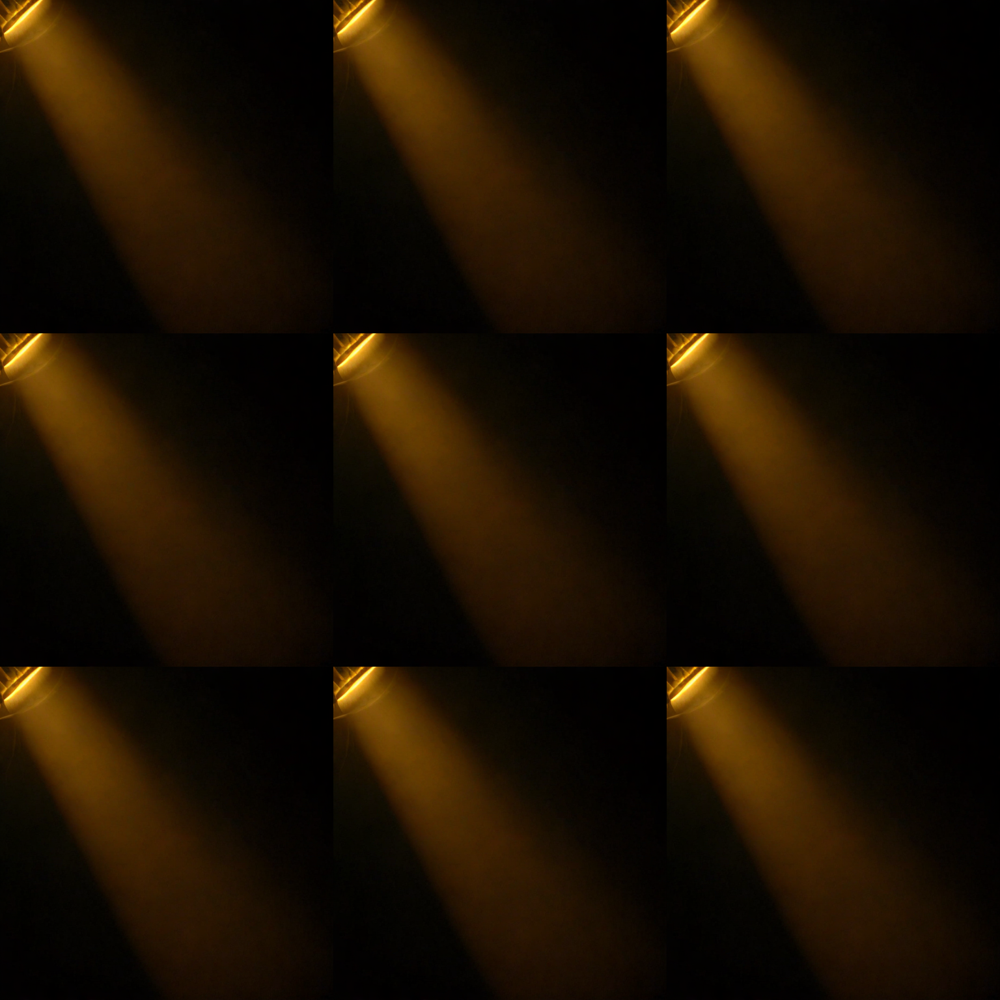

In [20]:
display(make_image_grid([*images], rows=3, cols=3, resize=512))